![title](images/header.png)


# Road Network and Travel Time Prediction from Satellite Imagery on a CPU
-----
Automated road network extraction from remote sensing imagery remains a significant challenge despite its importance in a broad array of applications. To this end, we explore road network extraction at scale with inference of semantic features of the graph, identifying speed limits and route travel times for each roadway. We call this approach City-Scale Road Extraction from Satellite Imagery (CRESI). See our [paper](http://openaccess.thecvf.com/content_WACV_2020/papers/Van_Etten_City-Scale_Road_Extraction_from_Satellite_Imagery_v2_Road_Speeds_and_WACV_2020_paper.pdf) for further details on CRESI.

Including estimates for travel time permits true optimal routing (rather than just the shortest geographic distance), which is not possible with existing remote sensing imagery based methods.  Such time-based routing is usually critical to most use cases, and can differ significantly from simple geometric routing (see figure below).

![title](images/routes.png)

This notebook focuses on the visualization of the output of ([Part 2](https://github.com/CosmiQ/cresi/tree/master/notebooks/dar_tutorial_cpu/cresi_cpu_part2.ipynb)), and explores optimized routing in a previously unseen city.
We assume the user has already set up the environment via [Part 1](https://github.com/CosmiQ/cresi/tree/master/notebooks/dar_tutorial_cpu/cresi_cpu_part1.ipynb). To open the CRESI environment exectue the following:
   - In the terminal enter:
       - cresi_dir=/Users/avanetten/cosmiq/cresi_v3/
       - docker run -it -v $cresi_dir:/opt/cresi -p 9111:9111 --ipc=host --name cresi_cpu cresi_cpu_image
       - cd /opt/cresi/notebooks/dar_tutorial_cpu_viz
       - jupyter notebook --ip 0.0.0.0 --port=9111 --no-browser --allow-root &
           - [Copy the token that appears]
   - In a browser open:
       - http://localhost:9111/notebooks/cresi_cpu_viz.ipynb
       - Paste the token copied above



In [1]:
# import packages within the docker kernel

import os
import json
import skimage.io
import osmnx as ox
import numpy as np
import pandas as pd
import scipy.spatial
import networkx as nx
import matplotlib.pyplot as plt

cresi_dir = '/opt/cresi'
src_dir = os.path.join(cresi_dir, 'cresi')
test_final_dir = os.path.join(cresi_dir, 'test_imagery/dar/PS-RGB_8bit_clip')
results_root_dir = os.path.join(cresi_dir, 'results')
results_dir = os.path.join(results_root_dir, 'dar_tutorial_cpu_ex')
mask_pred_dir = os.path.join(results_dir, 'folds')
mask_stitched_dir = os.path.join(results_dir, 'stitched/mask_norm')
skeleton_dir = os.path.join(results_dir, 'skeleton')

-----
## 2. Download Testing Imagery

For this exercise, we'll explore SpaceNet Area of Interest (AOI) \#10: Dar Es Salaam.  This city was withheld for testing purposes in SpaceNet 5, meaning that the pre-trained model has not been trained on this city whatsoever.  The data must be pre-processed to optimize performance, a step that we have already taken for a sample of the data, see Section 3 of [Part 2](https://github.com/avanetten/cresi/blob/master/notebooks/dar_tutorial_cpu/cresi_cpu_part2.ipynb). To download this sample (~375 MB):

In [ ]:
!aws s3 cp --recursive s3://spacenet-dataset/AOIs/AOI_10_Dar_Es_Salaam/samples {test_final_dir}

Image stats for AOI_10_Dar_Es_Salaam_PS-RGB_COG_clip.tif: 
- Image shape = (11770, 11111, 3) 
- Num pixels = 130,776,470
- Area = 11.7 km2

-----
## 3. Run Inference

The simplest option is to sipmly run the test.sh script (e.g. ```./test.sh configs/dar_tutorial_cpu.json```) which will execute all of the various inference scripts in series.  For this notebook we will just take the outputs of running the scripts detailed in [Part 2](https://github.com/avanetten/cresi/blob/master/notebooks/dar_tutorial_cpu/cresi_cpu_part2.ipynb).

-----
## Intermission: OSM / Commercial Products

One question that often gets asked about approaches like CRESI is: doesn't Google Mapp, Apple Maps, or OpenStreetMap (OSM) already do this? It turns out that there are a number of advantages to a computer vision centric approach, as detailed below.

Commercial products like Google/Apple certainly have a lot of value, but these products often rely upon cell phone GPS pings and infrequently updated imagery for determining real-time routing; in a dynamic scenario (e.g.: natural disaster) existing road networks may be out of date, and cell towers may be down.  Furthermore, the underlaying data is proprietary, further complicating use by practitioners.

Open source offerings such as OSM are similarly useful, though also have limitations.  The crowd-sourced nature of OSM means that updates can take significant time to re-map areas.  For example, it took the Humanitarian OpenStreetMap Team (HOT) over [two months](https://wiki.openstreetmap.org/wiki/2017_Hurricanes_Irma_and_Maria) to fully map Puerto Rico after Hurricane Maria in 2017, even with thousands of volunteers.  

Furthermore, OSM road metadata that can be used to optimize routing is often missing, and road centerline label quality is inconsistent.  For example in the image below there are missing roads on the left, and roads that go through buildings on the right.
<img src="images/osm_goofs.jpg" alt="Drawing" style="height: 200px;"/>

The label inconsistency was explored in Table 3 of our [CRESI paper](http://openaccess.thecvf.com/content_WACV_2020/papers/Van_Etten_City-Scale_Road_Extraction_from_Satellite_Imagery_v2_Road_Speeds_and_WACV_2020_paper.pdf), where we noted significantly reduced road inference performance when using OSM labels versus SpaceNet labels.  

As an example of the sparsity of OSM metadata, we pulled the OSM map for a portion of one of our training cities (Shanghai) below, and colored by the 'maxspeed' tag.  The vast majority of roads have no indicated speed limit.

<br>
<img src="images/shanghai_osm_speed.png" alt="Drawing" style="height: 500px;"/>
<br>

The point here is not to cast aspersions at OSM, which is a great resource, but to point out that there is a need for a rapid machine learning algorithm that can extract precise road centerlines and attendant metadata such as safe travel speed.  

The development of CRESI and administration of the [SpaceNet 5 Challege](https://spacenet.ai/sn5-challenge/) yielded a great many insights into both dataset requirements (e.g. SpaceNet + OSM, varying geographies), as well as algorithmic performance and robustness.  For further analysis of these insights we encourage readers to explore the following blogs:

1. [OSM+Google Imagery](https://medium.com/the-downlinq/computer-vision-with-openstreetmap-and-spacenet-a-comparison-cc70353d0ace)
2. [Neighborhood Comparisons](https://medium.com/the-downlinq/spacenet-5-results-deep-dive-part-2-apls-to-apls-2b1fc7307629)
3. [Predictive Features](https://medium.com/the-downlinq/spacenet-5-results-deep-dive-part-3-the-apls-sauce-378ca0666ca9)
4. [SpaceNet 5 Speed / Performance Comparision](https://medium.com/the-downlinq/spacenet-5-winning-model-release-end-of-the-road-fd02e00b826c)


------
## 4 Visualize Outputs

-----
### 4.1. Prediction Masks 

The 02_eval.py script produce a multi-channel road masks for each image tile.  Each channel of this mask corresponds to a unique speed range.  For each of the testing tiles, the predicted mask will look something like the plot below.

mask_pred.shape: (8, 1300, 1300)


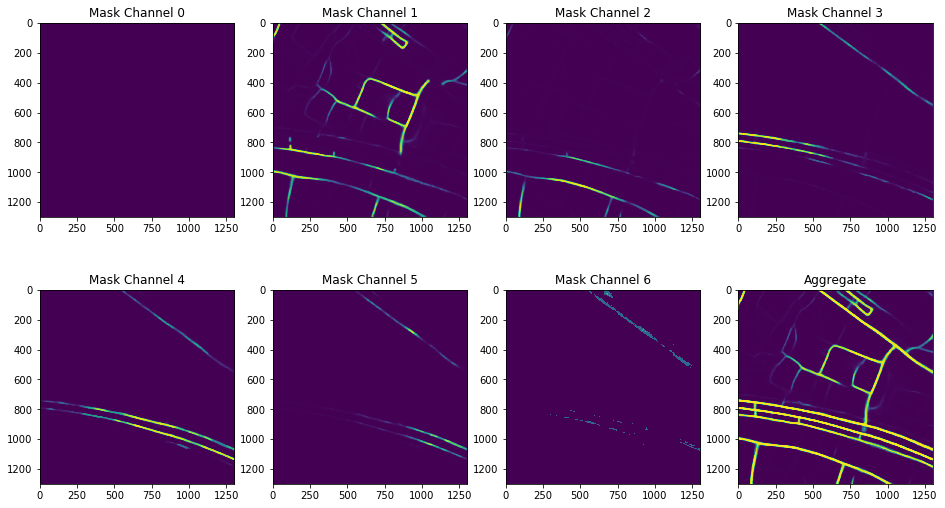

In [2]:
# inspect
mask_pred_file = 'fold0_0__AOI_10_Dar_Es_Salaam_PS-MS_COG_clip__5120__6400__1300__1300__11770__11111.tif'
mask_pred_path = os.path.join(mask_pred_dir, mask_pred_file)
mask_pred = skimage.io.imread(mask_pred_path)
print("mask_pred.shape:", mask_pred.shape)

# plot all layers
fig, axes = plt.subplots(2, 4, figsize=(16, 9))
for i, ax in enumerate(axes.flatten()):
    if i < (len(axes.flatten()) - 1):
        title = 'Mask Channel {}'.format(str(i))
    else:
        title = 'Aggregate' 
    ax.imshow(mask_pred[i,:,:])
    ax.set_title(title)

-----
### 4.2. Aggregate Stitched Mask

The output of 02_eval.py is a series of chipped prediction masks, which we stitch back together (using the procedure illustrated below) in order to produce the aggregate prediction mask.  

<br>
<img src="images/basiss_test.jpg" alt="Drawing" style="height: 500px;"/>
<br>

Many road extraction algorithms end here once a road pixel mask has been produced.  We still have a few more steps to go, however, but let's inspect the aggregate mask first.

mask_pred.shape: (8, 11111, 11770)


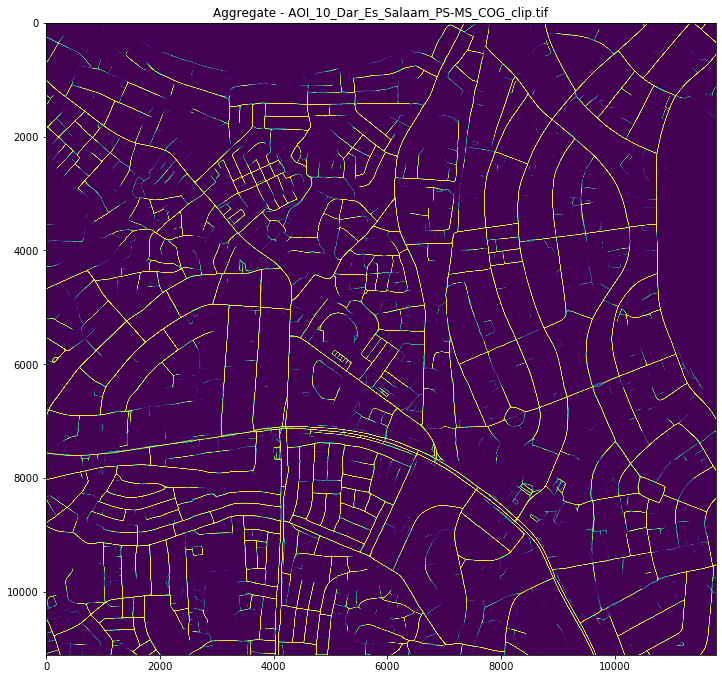

In [3]:
# Inspect the output
plot_all_layers = False
mask_pred_file = [z for z in os.listdir(mask_stitched_dir) if z.endswith('.tif')][0]
mask_pred_path = os.path.join(mask_stitched_dir, mask_pred_file)
mask_pred = skimage.io.imread(mask_pred_path)
print("mask_pred.shape:", mask_pred.shape)

# plot final layer
fig_width, fig_height = 12, 12
fig, ax = plt.subplots(figsize=(fig_width, fig_height))
_ = ax.imshow(mask_pred[-1,:,:])
_ = ax.set_title('Aggregate - ' + mask_pred_file)

# plot all layers (optional)
if plot_all_layers:
    fig, axes = plt.subplots(2, 4, figsize=(20, 11))
    for i, ax in enumerate(axes.flatten()):
        if i < (len(axes.flatten()) - 1):
            title = 'Mask Channel {}'.format(str(i))
        else:
            title = 'Aggregate' 
        ax.imshow(mask_pred[i,:,:])
        ax.set_title(title)

-----
### 4.3. Skeleton and Graph Creation.

The aggregate mask can be rendered into a skeleton, and from this skeleton we extract a geo-referenced [NetworkX](https://networkx.github.io) road graph.  See Sections 5.2-5.3 of [Part 2](https://github.com/avanetten/cresi/blob/master/notebooks/dar_tutorial_cpu/cresi_cpu_part2.ipynb) for further detail.

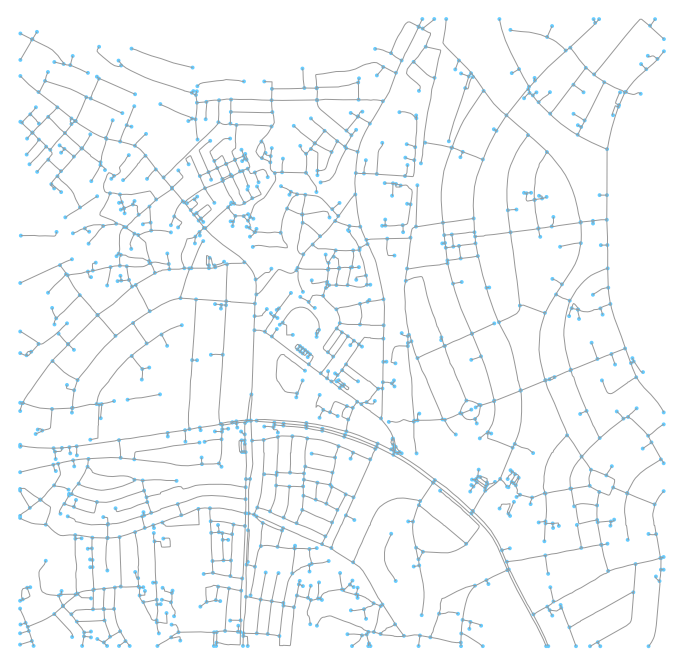

In [4]:
# inspect the output
gpickle_file = [z for z in os.listdir(os.path.join(results_dir, 'graphs')) if z.endswith('.gpickle')][0]
gpickle_path = os.path.join(results_dir, 'graphs', gpickle_file)
G0 = nx.read_gpickle(gpickle_path)
_, _ = ox.plot_graph(G0, fig_height=12, fig_width=12)

-----
### 4.4 Speed Inference

We use information encoded in the multi-channel prediction masks, in combination with the graph created from the previous step, to infer road speed and travel time (see figure below).  

<br>
<img src="images/speed_fig.jpg" alt="Drawing" style="height: 500px;"/> 

*Speed estimation procedure: Left: Sample multi-class prediction mask; the speed (r) of an individual patch (red square) can be inferred by measuring the signal from each channel. Right: Computed road graph; travel time (∆t) is given by speed (r) and segment length (∆l).*

Below, we plot the inferred road network coloring by inferred road speed, with speed increasing from yellow (15 mph) to red (65 mph).

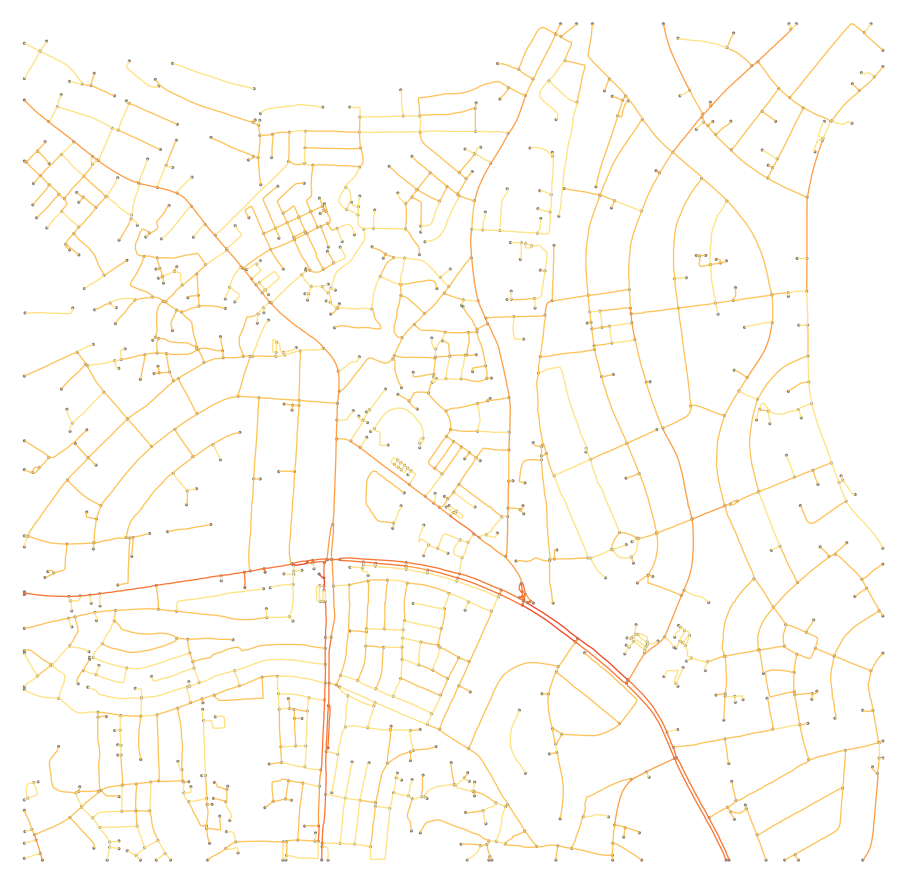

In [10]:
# Plot output graph, colored by speed
os.chdir(src_dir)
plot_graph_plus_im = __import__('08_plot_graph_plus_im')

# data
im_test = [z for z in os.listdir(test_final_dir) if z.endswith('.tif')][0]
im_test_path = os.path.join(test_final_dir, im_test)
im_test = skimage.io.imread(im_test_path).astype(np.uint8)

gpickle_file = [z for z in os.listdir(os.path.join(results_dir, 'graphs_speed')) if z.endswith('.gpickle')][0]
gpickle_path = os.path.join(results_dir, 'graphs_speed', gpickle_file)
G = nx.read_gpickle(gpickle_path)

# plot settings
fig_height=16
fig_width=16
node_color='gray'   
edge_color='#bfefff'   # lightblue
node_size=10
node_alpha=1
edge_color_key = 'inferred_speed_mph'
edge_linewidth=1.3
edge_alpha=1
route_color='blue'
orig_dest_node_color=('green', 'red')
orig_dest_node_alpha=0.8
route_linewidth=5*edge_linewidth
orig_dest_node_size=400
invert_yaxis = True
dpi=500
plt.close()

# # print an edge
# edge_tmp = list(G.edges())[-1]
# print (edge_tmp, "random edge props:", G.edges([edge_tmp[0], edge_tmp[1]])) #G.edge[edge_tmp[0]][edge_tmp[1]])

# plot
color_dict, color_list = plot_graph_plus_im.make_color_dict_list()
_ = plot_graph_plus_im.plot_graph_pix(G, im=None, fig_height=fig_height, fig_width=fig_width, 
                           node_size=node_size, node_alpha=node_alpha, node_color=node_color, 
                           edge_linewidth=edge_linewidth, edge_alpha=edge_alpha,
                           edge_color_key=edge_color_key, color_dict=color_dict,
                           invert_yaxis=invert_yaxis, 
                           default_dpi=dpi,
                           show=True, save=False)

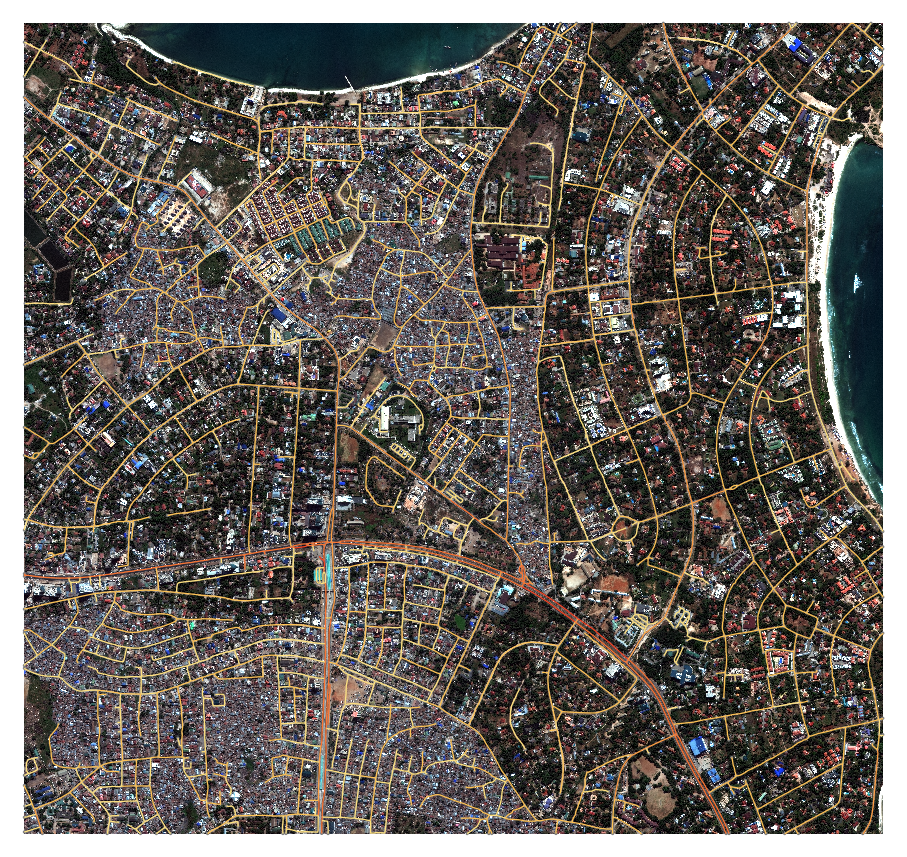

In [11]:
# We can also plot the graph with the image in the background
_ = plot_graph_plus_im.plot_graph_pix(G, im=im_test, fig_height=fig_height, fig_width=fig_width, 
                           node_size=node_size, node_alpha=node_alpha, node_color=node_color, 
                           edge_linewidth=edge_linewidth, edge_alpha=edge_alpha,
                           edge_color_key=edge_color_key, color_dict=color_dict,
                           invert_yaxis=invert_yaxis, 
                           default_dpi=dpi,
                           show=True, save=False)

-----
## 5. Routes

We can use our final road network to compute optimal routes between nodes of interest. Furthermore, we have flexibility in how we define "optimal",  as either distance traveled or total travel time is possible.  First let's collect the node coordinates into a [kd-tree](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.KDTree.html#scipy.spatial.KDTree) for quick nearest neighbor lookup:

In [12]:
# Get lat-lon positions of all the inferred nodes, read into a kd-tree
all_nodes = list(G.nodes())
print("N nodes:", len(all_nodes))
node_coords = np.array([[G.node[t]['lat'], G.node[t]['lon']] for t in all_nodes])
kdtree_nodes = scipy.spatial.KDTree(node_coords)
print("kdtree_nodes.data[:5]:", kdtree_nodes.data[:5])

N nodes: 1314
kdtree_nodes.data[:5]: [[-6.7580028 39.272364 ]
 [-6.7583619 39.2721831]
 [-6.7580028 39.2729526]
 [-6.7584591 39.2723802]
 [-6.7580028 39.2735439]]


Recall that our test image extends from (lat, lon) = (-6.7580, 39.25252,) to (lat, lon) = (-6.7880, 39.28430).  Let us assume a situation where we have a known asset position, and we want to evacuate to the northeast.  Let us explore this scenario:

In [13]:
asset_pos = [-6.78344, 39.26536]  # position of asset
evac_pos  = [-6.75800, 39.28430]  # northeast corner (evacuation location)

# get nodes nearest positions
n_asset = all_nodes[kdtree_nodes.query(asset_pos)[1]]
n_evac = all_nodes[kdtree_nodes.query(evac_pos)[1]]
print("start node, end node:", n_asset, n_evac)

# let's get the shortest path by distance:
weight0 = 'length'
print("\nWeight:", weight0)
length_m0, path0 = nx.single_source_dijkstra(G, source=n_asset, target=n_evac, weight=weight0)
length_km0 = length_m0 / 1000
print("path0:", path0)
print("Length0 (km):", length_km0)
# also compute time:
tt0 = sum([G[path0[i]][path0[i+1]][0]['Travel Time (h)'] for i in range(len(path0)-1)])
print("Travel Time (h)", tt0)

# Now let's weight by speed
weight1 = 'Travel Time (h)'
print("\nWeight:", weight1)
tt1, path1 = nx.single_source_dijkstra(G, source=n_asset, target=n_evac, weight=weight1)
print("path1:", path1)
length_km1 = sum([G[path1[i]][path1[i+1]][0]['length'] for i in range(len(path1)-1)])/1000
print("Length1 (km):", length_km1)
print("Travel Time (h)", tt1)

start node, end node: 16193 10024

Weight: length
path0: [16193, 16151, 15971, 16173, 16052, 15877, 15647, 15493, 15148, 15027, 14769, 14725, 14685, 14894, 14920, 14819, 14792, 14574, 14190, 14148, 13934, 13624, 13487, 13160, 12538, 12485, 12245, 12468, 12239, 11744, 11531, 11434, 11016, 10851, 10552, 10520, 10340, 10200, 10100, 10031, 10166, 10041, 10032, 10024]
Length0 (km): 4.6395324126357425
Travel Time (h) 0.10877731540417628

Weight: Travel Time (h)
path1: [16193, 16151, 15977, 15946, 15842, 15342, 14918, 14509, 14493, 14238, 13524, 13407, 13202, 13166, 12888, 12814, 12618, 12418, 12428, 12549, 12583, 12579, 12423, 12485, 12245, 12468, 12239, 11744, 11531, 11434, 11016, 10851, 10552, 10520, 10340, 10200, 10100, 10031, 10166, 10041, 10032, 10024]
Length1 (km): 4.678192348310912
Travel Time (h) 0.10604742062754784


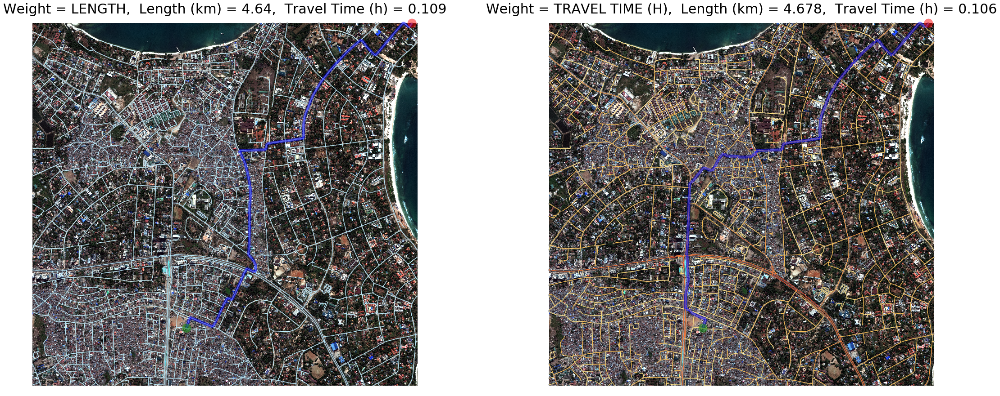

In [14]:
# Make plots...
rowplot = True
plt.close()
if rowplot:
    # side by side (easier to compare)
    fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(2*fig_width, fig_height))  
else:
    # vertically aligned (larger)
    fig, (ax0, ax1) = plt.subplots(nrows=2, figsize=(fig_width, 2.1*fig_height))  

# plot length
fout = os.path.join(results_dir, 'plots/route0_length.png')  # saving is slow...
fig, ax0 = plot_graph_plus_im.plot_graph_route_pix(G, path0, im=im_test, fig_height=fig_height, fig_width=fig_width, 
                      node_size=node_size, node_alpha=node_alpha, node_color=node_color, 
                      edge_linewidth=edge_linewidth, edge_alpha=edge_alpha, edge_color=edge_color,
                      orig_dest_node_size=orig_dest_node_size,
                      route_color=route_color, 
                      orig_dest_node_color=orig_dest_node_color,
                      route_linewidth=route_linewidth,
                      invert_yaxis=invert_yaxis, 
                      default_dpi=dpi,                        
                      show=False, close=False,
                      edge_color_key=None, color_dict=None,
                      save=False, filename=fout,
                      fig=fig, ax=ax0)
_ = ax0.set_title("Weight = {},  Length (km) = {},  Travel Time (h) = {}".format(
    weight0.upper(), np.round(length_km0, 3), np.round(tt0, 3)), fontsize=30)

# plot speed
fig, ax1 = plot_graph_plus_im.plot_graph_route_pix(G, path1, im=im_test, fig_height=fig_height, fig_width=fig_width, 
                      node_size=node_size, node_alpha=node_alpha, node_color=node_color, 
                      edge_linewidth=edge_linewidth, edge_alpha=edge_alpha, edge_color=edge_color,
                      orig_dest_node_size=orig_dest_node_size,
                      route_color=route_color, 
                      orig_dest_node_color=orig_dest_node_color,
                      route_linewidth=route_linewidth,
                      invert_yaxis=invert_yaxis, 
                      default_dpi=dpi,                        
                      show=False, close=False,
                      edge_color_key=edge_color_key,
                      color_dict=color_dict,
                      save=False, filename=fout,
                      fig=fig, ax=ax1)
_ = ax1.set_title("Weight = {},  Length (km) = {},  Travel Time (h) = {}".format(
    weight1.upper(), np.round(length_km1, 3), np.round(tt1, 3)), fontsize=30)

plt.tight_layout()
plt.show()

----
Clearly, the optimal route is very different when weighting by time rather than distance, underscoring the need to incorporate speed estimates into road graphs.  We encourage the interested reader to explore optimal routes between random nodes in the cell below (running multiple times will yield different results each time).

Weight: Travel Time (h)
Start node: 12296, End node: 17303
Optimal path:
 [16193, 16151, 15977, 15946, 15842, 15342, 14918, 14509, 14493, 14238, 13524, 13407, 13202, 13166, 12888, 12814, 12618, 12418, 12428, 12549, 12583, 12579, 12423, 12485, 12245, 12468, 12239, 11744, 11531, 11434, 11016, 10851, 10552, 10520, 10340, 10200, 10100, 10031, 10166, 10041, 10032, 10024]
Optimal path coordinates:
 [[-6.768414  39.2781906]
 [-6.7680198 39.2780961]
 [-6.768198  39.2767245]
 [-6.7717026 39.2771862]
 [-6.7724964 39.2761548]
 [-6.7757553 39.2772294]
 [-6.7757688 39.2772267]
 [-6.7783203 39.2769378]
 [-6.7784958 39.2768325]
 [-6.7799889 39.2762196]
 [-6.7805559 39.2754798]
 [-6.7815279 39.2748642]
 [-6.7815441 39.2748642]
 [-6.7834017 39.2763087]
 [-6.7839498 39.2765517]
 [-6.7843197 39.2766489]
 [-6.7864662 39.2778639]
 [-6.7860963 39.2785497]
 [-6.7862637 39.2786631]
 [-6.7861503 39.2792382]
 [-6.7870818 39.2796405]
 [-6.787989  39.2799672]]
Length (km): 2.894575169523716
Travel Time (h) 0.0574

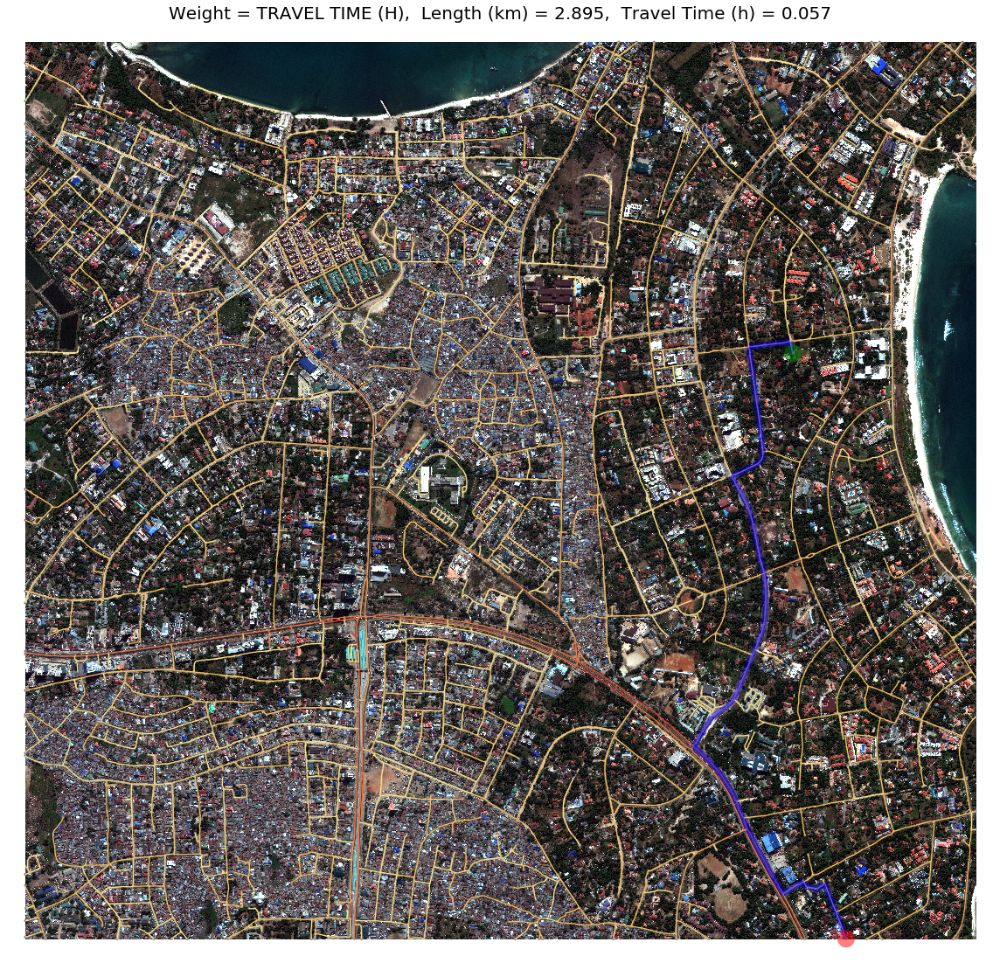

In [16]:
# Plot of optimal route between two random nodes
weight2 = 'Travel Time (h)'  # 'length'
save_plot = False  # saving is rather slow
dpi = 100

# get random lat, lon start and end positions
lat_vals = np.random.uniform(low=-6.7880, high=-6.7580, size=(4))
lon_vals = np.random.uniform(low=39.25252, high=39.28430, size=(4))
start_pos = [lat_vals[0], lon_vals[0]]
end_pos0 = [lat_vals[1], lon_vals[1]]
end_pos1 = [lat_vals[2], lon_vals[3]]

# get nodes nearest positions
n_start = all_nodes[kdtree_nodes.query(start_pos)[1]]
n_end0 = all_nodes[kdtree_nodes.query(end_pos0)[1]]
n_end1 = all_nodes[kdtree_nodes.query(end_pos1)[1]]

print("Weight:", weight2)
try:
    _, path2 = nx.single_source_dijkstra(G, source=n_start, target=n_end0, weight=weight2)
    n_end = n_end0
except:
    _, path2 = nx.single_source_dijkstra(G, source=n_start, target=n_end1, weight=weight2)
    n_end = n_end1
print("Start node: {}, End node: {}".format(n_start, n_end))

path_coords = np.array([[G.node[t]['lat'], G.node[t]['lon']] for t in path2])
print("Optimal path:\n", path1)
print("Optimal path coordinates:\n", path_coords)
length_km2 = sum([G[path2[i]][path2[i+1]][0]['length'] for i in range(len(path2)-1)])/1000
tt2 = sum([G[path2[i]][path2[i+1]][0]['Travel Time (h)'] for i in range(len(path2)-1)])
print("Length (km):", length_km2)
print("Travel Time (h)", tt2)

if save_plot:
    fout = os.path.join(results_dir, 'plots/route_asset_time.png')  
else: 
    fout = ''

# plot speed
plt.close()
fig2, ax2 = plot_graph_plus_im.plot_graph_route_pix(G, path2, im=im_test, fig_height=fig_height, fig_width=fig_width, 
                      node_size=node_size, node_alpha=node_alpha, node_color=node_color, 
                      edge_linewidth=edge_linewidth, edge_alpha=edge_alpha, edge_color=edge_color,
                      orig_dest_node_size=orig_dest_node_size,
                      route_color=route_color, 
                      orig_dest_node_color=orig_dest_node_color,
                      route_linewidth=route_linewidth,
                      invert_yaxis=invert_yaxis, 
                      default_dpi=dpi,                        
                      show=True, close=False,
                      edge_color_key=edge_color_key,
                      color_dict=color_dict,
                      save=save_plot, filename=fout)
_ = ax2.set_title("Weight = {},  Length (km) = {},  Travel Time (h) = {}".format(
    weight2.upper(), np.round(length_km2, 3), np.round(tt2, 3)), fontsize=20)
plt.tight_layout()
plt.show()

----
### Conclusion

In this tutorial, we explored how to visualize large road network graphs extracted from satellite imagery using only open source data and code.  We showed how to compute and plot optimal routes, and demonstrated the importance of routing using speed versus geometric distance.  We encourage interested parties to explore new testing regions, dive deeper into the intricacies of road network extraction and routing, and to contribute to open source geospatial software if time and interest permits.  